In [6]:
%matplotlib inline

import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np


In [7]:
calibration_image_files = glob.glob('./camera_cal/*.jpg')

In [9]:
cal_image = cv2.imread(calibration_image_files[0])

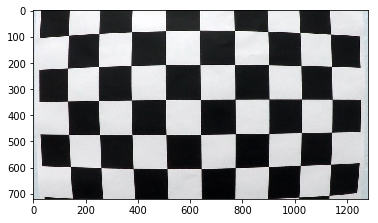

In [10]:
plt.imshow(cal_image)

In [35]:
cols=9
rows=6
gray = cv2.cvtColor(cal_image, cv2.COLOR_BGR2GRAY)
ret, corners = cv2.findChessboardCorners(gray, (cols, rows), None)

In [36]:
ret

True

./camera_cal/calibration1.jpg
False
./camera_cal/calibration10.jpg
True
./camera_cal/calibration11.jpg
True
./camera_cal/calibration12.jpg
True
./camera_cal/calibration13.jpg
True
./camera_cal/calibration14.jpg
True
./camera_cal/calibration15.jpg
True
./camera_cal/calibration16.jpg
True
./camera_cal/calibration17.jpg
True
./camera_cal/calibration18.jpg
True
./camera_cal/calibration19.jpg
True
./camera_cal/calibration2.jpg
True
./camera_cal/calibration20.jpg
True
./camera_cal/calibration3.jpg
True
./camera_cal/calibration4.jpg
False
./camera_cal/calibration5.jpg
False
./camera_cal/calibration6.jpg
True
./camera_cal/calibration7.jpg
True
./camera_cal/calibration8.jpg
True
./camera_cal/calibration9.jpg
True


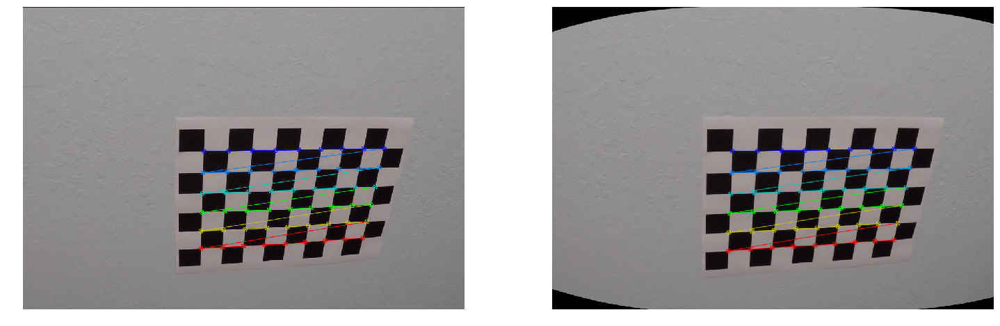

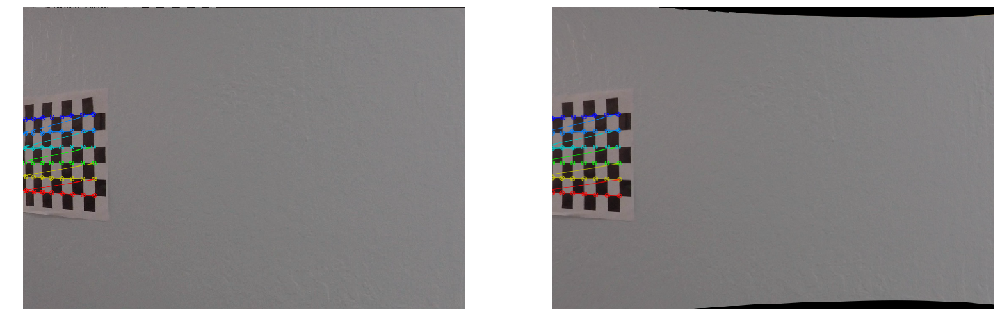

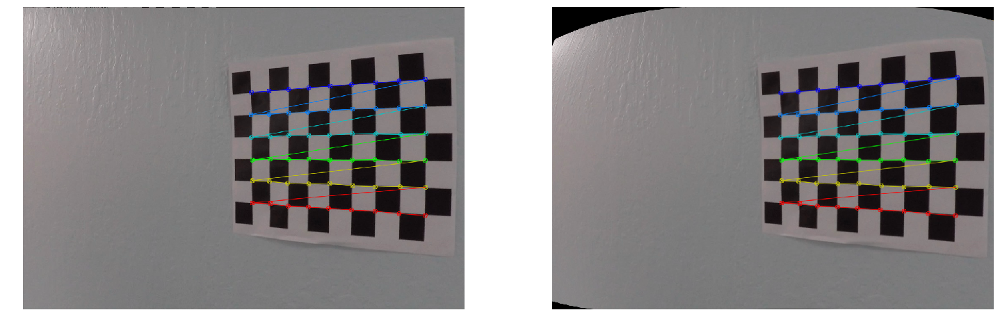

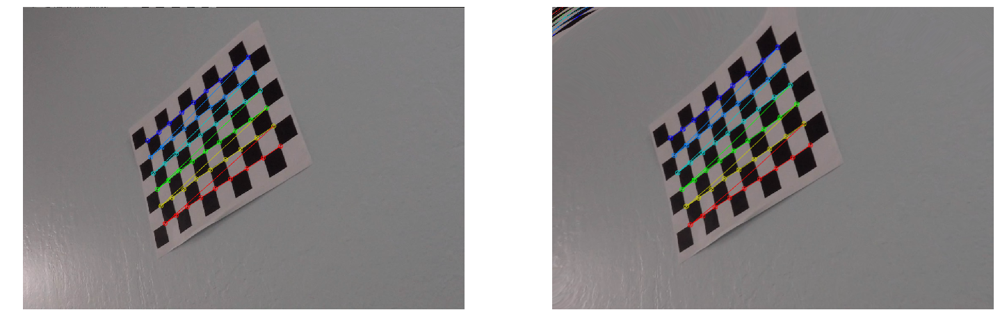

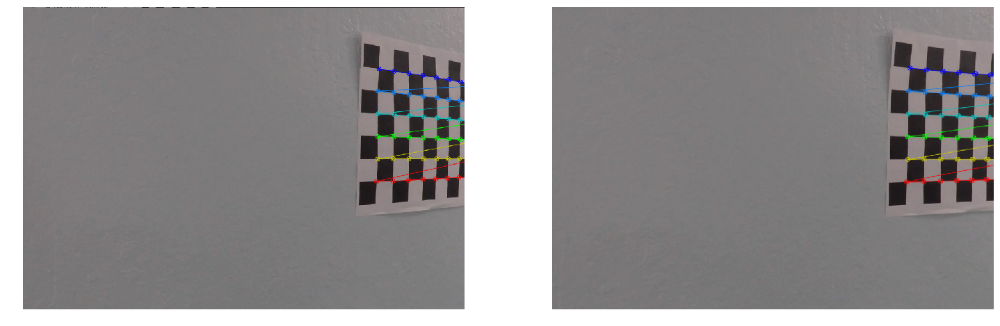

...

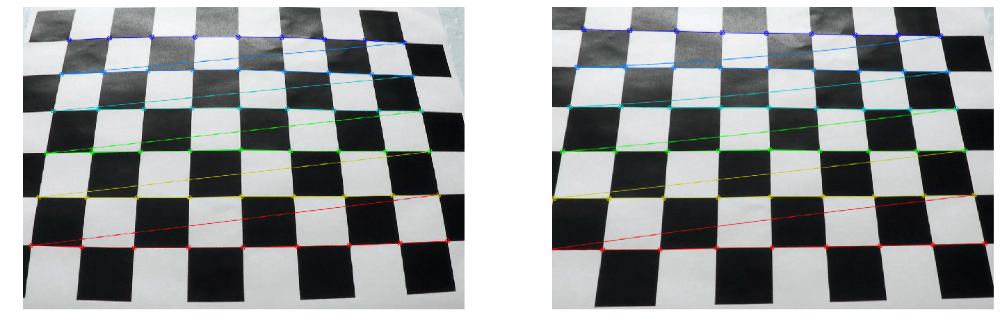

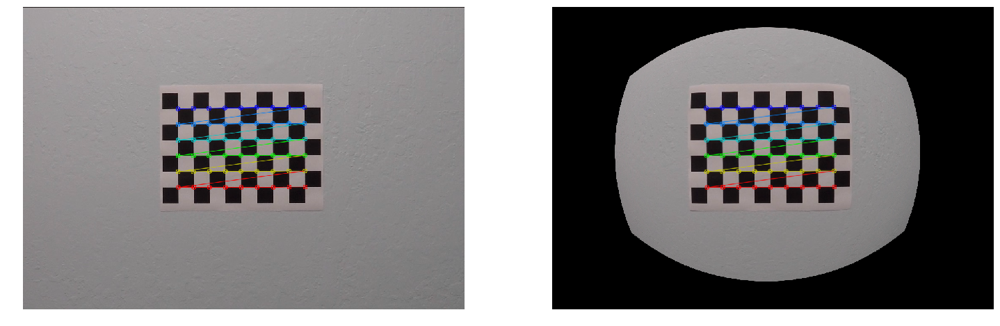

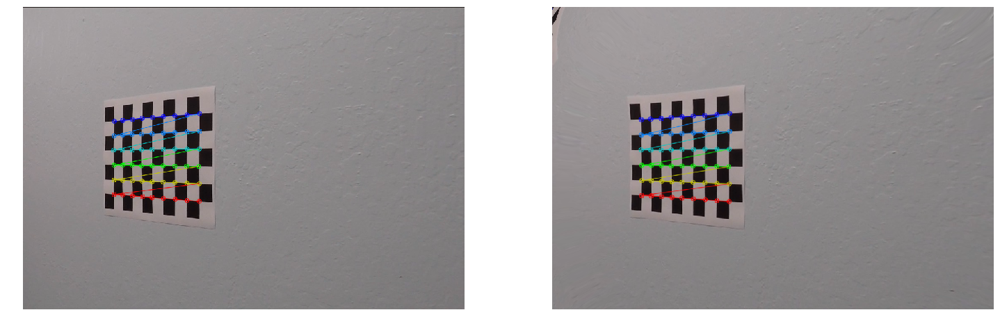

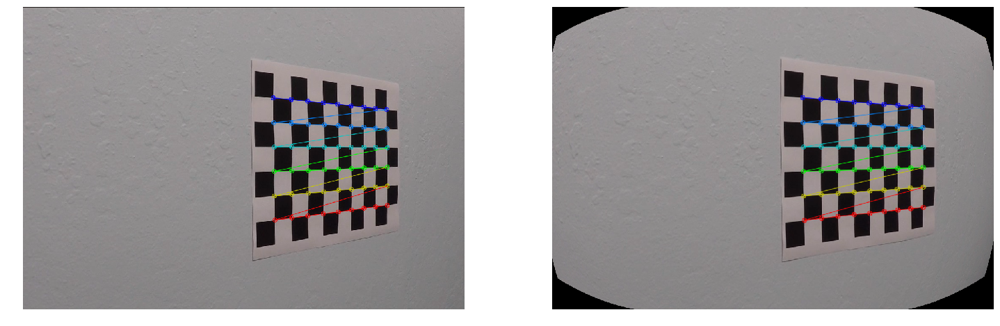

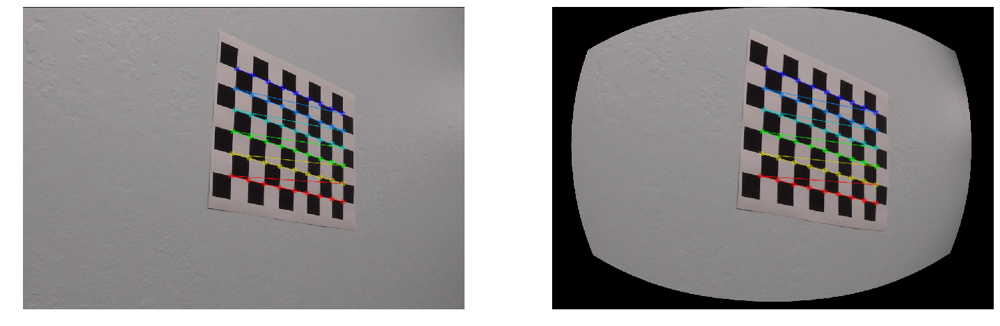

In [518]:
mtx_list = []
dist_list = []
for f in calibration_image_files:
    objectPoints=[]
    imagePoints=[]
    cal_image = cv2.imread(f)
    gray = cv2.cvtColor(cal_image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (cols, rows), None)
    print(f)
    print(ret)
    if not ret:
        continue
    img = cv2.drawChessboardCorners(cal_image, (cols, rows), corners, ret)
    objp = np.zeros((cols * rows, 3), np.float32)
    objp[:,:2] = np.mgrid[0:cols,0:rows].T.reshape(-1, 2)
    objectPoints.append(objp)
    imagePoints.append(corners)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objectPoints, imagePoints, gray.shape[::-1], None, None)
    mtx_list.append(mtx)
    dist_list.append(dist)
    undist = cv2.undistort(img, mtx, dist)
    show_side_by_side(img, undist)

In [51]:
dist

array([[-0.51076032,  2.9209347 , -0.00863694,  0.00962945,  1.38483301]])

In [45]:
cal_image.shape

(720, 1280, 3)

In [61]:
test_img_files = glob.glob('./test_images/*.jpg')
mtx

array([[  1.78294066e+03,   0.00000000e+00,   6.74294630e+02],
       [  0.00000000e+00,   1.40968796e+03,   4.85027680e+02],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]])

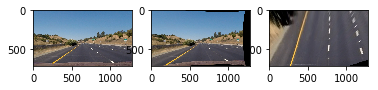

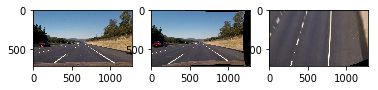

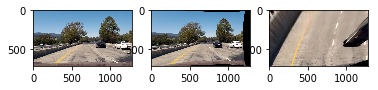

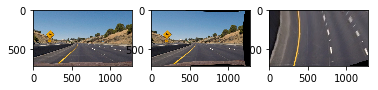

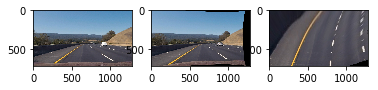

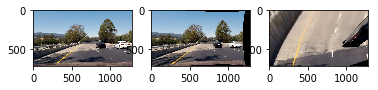

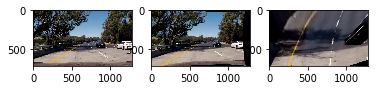

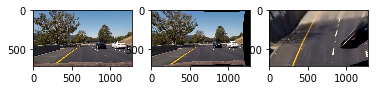

In [90]:
for f in test_img_files:
    img = cv2.imread(f)
    ## How do we pick which calibration matrix and distortion coeffs?
    ## Eyeballed. Any better way?
    undist = cv2.undistort(img, mtx_list[1], dist_list[1])
    fig = plt.figure()
    fig.add_subplot(1,3,1)
    plt.imshow(img[:,:,::-1])
    fig.add_subplot(1,3,2)
    plt.imshow(undist[:,:,::-1])
    src = np.float32([(500, 500), (750, 500), (400, 600), (900, 600)])
    dst = np.float32([(300, 500), (750, 500), (300, 700), (750, 700)])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img.shape[0:2][::-1])
    fig.add_subplot(1,3,3)
    plt.imshow(warped[:,:,::-1])


In [67]:
test_img_files[1]

'./test_images/straight_lines2.jpg'

In [98]:
def show_side_by_side(im1, im2):
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
    f.set_size_inches(f.get_size_inches() * 2)
    f.set_figwidth(25)
    ax1.axis('off')
    ax2.axis('off')

    ax1.imshow(im1, cmap='gray')
    ax2.imshow(im2, cmap='gray')

In [206]:
def identify_lanes(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.warpPerspective(gray, M, img.shape[0:2][::-1])
    img_warped = cv2.warpPerspective(img, M, img.shape[0:2][::-1])
    R = img_warped[:,:,2]
    B = img_warped[:,:,0]
    G = img_warped[:,:,1]

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    abs_sobely = np.absolute(sobely)
    scaled_sobel = np.uint8(255 * abs_sobely / np.max(abs_sobely))

    grad_mag = np.sqrt(sobelx ** 2 + sobely ** 2)
    scale_factor = np.max(grad_mag)/255 
    grad_mag = (grad_mag/scale_factor).astype(np.uint8) 
    
    
    grad_dir_abs = np.arctan2(abs_sobelx, abs_sobely)
    
    min_grad = 50
    max_grad = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[
          # ((scaled_sobel >= min_grad) & (scaled_sobel <= max_grad))              
          # ((grad_mag >= 0.0) & (grad_mag <= 150.0)) 
          # ((gray > 30) & (gray <=255)) 
        ((grad_dir_abs >= np.pi/5) & (grad_dir_abs <= np.pi/2))            
        & ((R > 200) & (R <= 255))
        & ((B > 50))
        & ((G > 100))
    ] = 1
    
    return gray, sxbinary



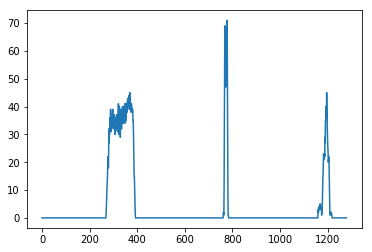

In [164]:
plt.plot(imgbin[imgbin.shape[0]//2:,:].sum(axis=0))

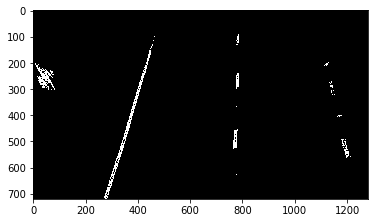

In [163]:
plt.imshow(imgbin, cmap='gray')

In [165]:
np.where(imgbin[imgbin.shape[0]//2:,:].sum(axis=0) > 10)

(array([ 273,  274,  275,  276,  277,  278,  279,  280,  281,  282,  283,
         284,  285,  286,  287,  288,  289,  290,  291,  292,  293,  294,
         295,  296,  297,  298,  299,  300,  301,  302,  303,  304,  305,
         306,  307,  308,  309,  310,  311,  312,  313,  314,  315,  316,
         317,  318,  319,  320,  321,  322,  323,  324,  325,  326,  327,
         328,  329,  330,  331,  332,  333,  334,  335,  336,  337,  338,
         339,  340,  341,  342,  343,  344,  345,  346,  347,  348,  349,
         350,  351,  352,  353,  354,  355,  356,  357,  358,  359,  360,
         361,  362,  363,  364,  365,  366,  367,  368,  369,  370,  371,
         372,  373,  374,  375,  376,  377,  378,  379,  380,  381,  382,
         383,  384,  385,  386,  387,  388,  389,  766,  767,  768,  769,
         770,  771,  772,  773,  774,  775,  776,  777,  778,  779,  780,
         781, 1180, 1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1189,
        1190, 1191, 1192, 1193, 1194, 

In [331]:
def computeDistanceCurvature(binary_warped, leftx, lefty, rightx, righty):
# Fit polynomials to x,y in world space, to measure curvature and distance in meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    ym_max = (binary_warped.shape[0] - 1) * ym_per_pix
    
    left_curverad = ((1 + (2*left_fit_cr[0]*ym_max + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*ym_max + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    left_xm = np.polyval(left_fit_cr, ym_max)
    right_xm = np.polyval(right_fit_cr, ym_max)
    
    cam_x_midpoint = (left_xm + right_xm) / 2
    img_x_midpoint = binary_warped.shape[1] / 2 * xm_per_pix
    
    distance = img_x_midpoint - cam_x_midpoint
    
    return distance, left_curverad, right_curverad


In [354]:
def sliding_window(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    if len(leftx) == 0 or len(lefty) == 0 or len(rightx) == 0 or len(righty) == 0:
        return out_img, (leftx, lefty), (rightx, righty), None, None
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    out_img[np.int32(ploty), np.clip(np.int32(left_fitx), 0, binary_warped.shape[1]-1)] = [255,255,0]
    out_img[np.int32(ploty), np.clip(np.int32(right_fitx), 0, binary_warped.shape[1]-1)] = [255,255,0]

#    print("Distance from center=",distance)
#    print("Left curvature=", leftcr)
#    print("Right curvature=", rightcr)
                                                        

    #plt.imshow(out_img)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    
    return out_img, (leftx, lefty), (rightx, righty), left_fit, right_fit

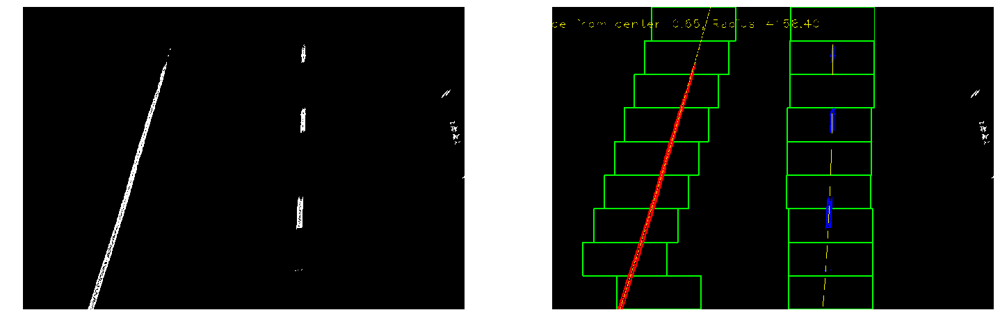

In [352]:
out_img, (leftx, lefty), (rightx, righty), left_fit, right_fit = sliding_window(imgbin)
show_side_by_side(imgbin, out_img)

In [203]:
def fill_lanes_with_color(imgbin, left_fit, right_fit):
    ploty = np.linspace(0, imgbin.shape[0]-1, imgbin.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    warp_zero = np.zeros_like(imgbin).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    return color_warp

In [204]:
src = np.float32([(500, 500), (750, 500), (400, 600), (900, 600)])
dst = np.float32([(300, 500), (750, 500), (300, 700), (750, 700)])
Minv = cv2.getPerspectiveTransform(dst, src)

In [198]:
color_warp = fill
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

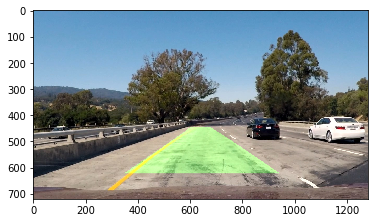

In [315]:
undist = cv2.undistort(img, mtx_list[1], dist_list[1])
result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
plt.imshow(result[:,:,::-1])

In [202]:
dist_list[1]

array([[  4.95354546e+00,  -1.40310730e+02,  -9.28615893e-03,
          2.17645354e-01,   7.02919741e+02]])

In [500]:
from collections import deque

class LaneTracker():
    def __init__(self, buffer_sz=10, tolerance=2, maxRejections=10):
        self.buffer_size = buffer_sz
        self.last_n_fits = deque(maxlen=self.buffer_size)
        self.tolerance_ = tolerance
        self.mean_ = None
        self.std_ = None
        self.rejections_ = 0
        self.maxRejections_ = maxRejections
    
    def newEstimate(self, curve):
        if self.isNotNoisy(curve):
            self.last_n_fits.append(curve)
            self.mean_ = np.mean(self.last_n_fits, axis=0)
            self.std_ = np.std(self.last_n_fits, axis=0)
            return curve, True
        
        # reject current estimate and return last estimate        
        self.rejections_ += 1
        return self.last_n_fits[-1], False
    
    def isNotNoisy(self, curve):
        if self.rejections_ >= self.maxRejections_:
            self.rejections_ = 0 
            return True
        if len(self.last_n_fits) < self.buffer_size:
            return True
        if (np.all(np.abs(curve - self.mean_) / self.tolerance_ < 
                np.maximum(0.05 * np.abs(self.mean_), leftTracker.std_))):
            return True
        return False
               

In [506]:
def process(img, leftTracker=None, rightTracker=None):
    gray, imgbin = identify_lanes(img)
    out_img, (leftx, lefty), (rightx, righty), left_fit, right_fit = sliding_window(imgbin)
    if left_fit is None or right_fit is None:
        return img
    
    if leftTracker:
        left_fit_checked, left_is_noisy = leftTracker.newEstimate(left_fit)
        if left_is_noisy:
            print("Rejected left")
    else:
        left_fit_checked = left_fit
    
    if rightTracker:
        right_fit_checked, right_is_noisy = rightTracker.newEstimate(right_fit)
        if right_is_noisy:
            print("Rejected right")
    else:
        right_fit_checked = right_fit
    
    
    color_warp = fill_lanes_with_color(imgbin, left_fit_checked, right_fit_checked)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    undist = cv2.undistort(img, mtx_list[1], dist_list[1])
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    distance, leftcr, rightcr = computeDistanceCurvature(result, leftx, lefty, rightx, righty)
    text="Distance from center={:.2f}m, Radius={:.2f}m".format(distance, (leftcr+rightcr)/2)
    cv2.putText(result, text, (10, 50), cv2.FONT_HERSHEY_PLAIN, 2, (0,255,255))
    return result

In [504]:
right_fit

array([ -6.69562365e-05,   1.67486526e-02,   7.81043512e+02])

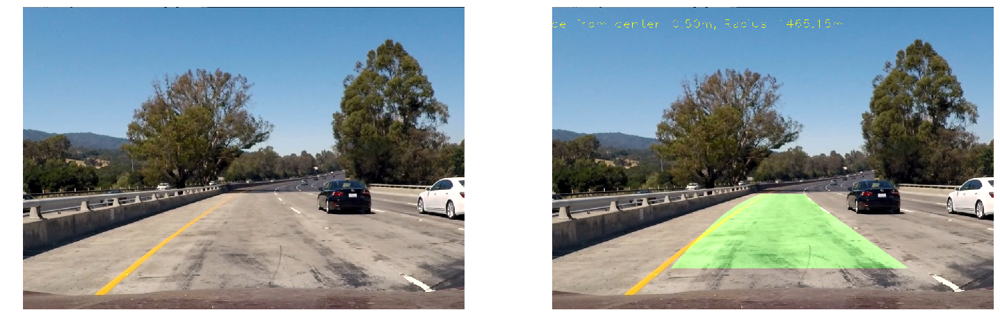

In [507]:
for f in test_img_files[2:3]:
    img = cv2.imread(f)
    result = process(img)
    show_side_by_side(img[:,:,::-1], result[:,:,::-1])

In [216]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [513]:
movie_file ='./project_video.mp4'
movie_outfile = './project_video_output_tmp_05.mp4'
clip1 = VideoFileClip(movie_file).subclip(25,35)

In [516]:
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter('./project_video_output_1_with_tracking.mp4', fourcc, 30, (img.shape[1], img.shape[0]))

In [517]:
%%time
leftTracker = LaneTracker()
rightTracker = LaneTracker()
cap = cv2.VideoCapture(movie_file)
cap.set(cv2.CAP_PROP_POS_MSEC, 0)
ret, image = cap.read()
while cap.isOpened():
    count = count + 1
    ret, image = cap.read()
    if not ret:
        break
    res = process(image, leftTracker, rightTracker)
    out.write(res)
cv2.destroyAllWindows()
out.release()
cap.release()

Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected right
Rejected right
Rejected right
Rejected right
Rejected left
Rejected left
Rejected left
Rejected left
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected right
Rejected left
Rejected right
Rejected left
Rejected left
Rejected left
Rejected left
Rejected left
Rejected right
Rejected left
Rejected left
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected right
Rejected right
Rejected right
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right
Rejected left
Rejected right


In [ ]:
### END ####

In [ ]:
### Testing tracker ###

In [370]:
left_fit

array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02])

In [371]:
left_fit+left_fit


array([ -5.61528107e-05,  -5.57981340e-01,   9.83324370e+02])

In [372]:
from collections import deque

In [375]:
dq = deque(maxlen=10)

In [382]:
dq.append(left_fit)
dq.append(right_fit)
dq.append(left_fit)
dq.append(left_fit)
dq.append(right_fit)

In [391]:
m = np.mean(dq, axis=0)
s = np.std(dq, axis=0)

In [414]:
np.all(np.abs((right_fit * 2 - m)/2) < s)

False

In [407]:
len(dq)

10

In [471]:
leftTracker = LaneTracker(5,3)

In [488]:
leftTracker.newEstimate(right_fit)

(array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02]), False)

In [456]:
right_fit

array([ -6.69562365e-05,   1.67486526e-02,   7.81043512e+02])

In [487]:
leftTracker.std_

array([  3.38813179e-21,   0.00000000e+00,   5.68434189e-14])

In [463]:
np.max(np.ones_like(leftTracker.std_), leftTracker.std_)

TypeError: only integer scalar arrays can be converted to a scalar index

In [469]:
np.maximum(0.05 * np.abs(leftTracker.mean_), leftTracker.std_)

array([  3.34781183e-06,   8.37432630e-04,   3.90521756e+01])

In [479]:
leftTracker.last_n_fits

deque([array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02]),
       array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02]),
       array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02]),
       array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02]),
       array([ -2.80764053e-05,  -2.78990670e-01,   4.91662185e+02])])

In [510]:
img.shape

(720, 1280, 3)